# MSDS 7331 - Lab 3 - Airline Satisfaction Dataset
***
Team - Triston Hudgins, Shijo Joseph, Douglas Yip

#### The dataset chosen is a compilation of airline customer satisfaction surveys.  The goal is to select from one of features (Association Rule Mining, Clustering, or Collaborative Filtering) to build a classifier and analyze its performance in terms of accuracy (precision, recall) and speed) to help us understand the customer sastification. 

Source: https://www.kaggle.com/datasets/teejmahal20/airline-passenger-satisfaction?resource=download&select=test.csv

In [1]:
## Setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore', DeprecationWarning)
%matplotlib inline
import seaborn as sns
import plotly.express as px
import scipy.stats as stats

# Import Cluster Analysis libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors
import scipy.cluster.hierarchy as sch

#import visualization libraries
from matplotlib.pyplot import scatter
import plotly
from plotly.graph_objs import Scatter, Marker, Layout, layout,XAxis, YAxis, Bar, Line
%matplotlib inline

# get ANOVA table as R like output
import statsmodels.api as sm
from statsmodels.formula.api import ols

***
### Data Understanding (20 points total)
### [10 points] Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these problems?

In [2]:
# load the airline satisfaction  dataset

df = pd.read_csv('https://raw.githubusercontent.com/dk28yip/MSDS7331/main/airline.csv') # read in the csv file
df.head()

#reduced samples set from 100,000 to 30,000 as a few of us had computer performance issues
df = df.sample(n=30000)

#### Check for NAs


In [3]:
# Any missing values in the dataset
def plot_missingness(df: pd.DataFrame=df) -> None:
    nan_df = pd.DataFrame(df.isna().sum()).reset_index()
    nan_df.columns  = ['Column', 'NaN_Count']
    nan_df['NaN_Count'] = nan_df['NaN_Count'].astype('int')
    nan_df['NaN_%'] = round(nan_df['NaN_Count']/df.shape[0] * 100,4)
    nan_df['Type']  = 'Missingness'
    nan_df.sort_values('NaN_%', inplace=True)

    # Add completeness
    for i in range(nan_df.shape[0]):
        complete_df = pd.DataFrame([nan_df.loc[i,'Column'],df.shape[0] - nan_df.loc[i,'NaN_Count'],100 - nan_df.loc[i,'NaN_%'], 'Completeness']).T
        complete_df.columns  = ['Column','NaN_Count','NaN_%','Type']
        complete_df['NaN_%'] = complete_df['NaN_%'].astype('int')
        complete_df['NaN_Count'] = complete_df['NaN_Count'].astype('int')
        nan_df = pd.concat([nan_df,complete_df], sort=True)
            
    nan_df = nan_df.rename(columns={"Column": "Feature", "NaN_%": "Missing %"})

    # Missingness Plot
    fig = px.bar(nan_df,
                 x='Feature',
                 y='Missing %',
                 title=f"Missingness Plot (N={df.shape[0]})",
                 color='Type',
                 opacity = 0.6,
                 color_discrete_sequence=['red','#808080'],
                 width=800,
                 height=800)
    fig.show()

plot_missingness(df)

print("Missing 99 values if the 'Arrival Delay in Minutes'column; approximately 0.31%.")

Missing 99 values if the 'Arrival Delay in Minutes'column; approximately 0.31%.


#### Remove unwanted columns
ID was removed from the dataset as it was used as a unique identified for each passenger

In [4]:
df["GenderNumeric"] = (df["Gender"]=="Male").astype(int)
df["CustomerTypeNumeric"] = (df["Customer Type"]=="Loyal Customer").astype(int)
df["TypeofTravelNumeric"] = (df["Type of Travel"]=="Personal Travel").astype(int)
df["ClassNumeric"] = df["Class"]
df["ClassNumeric"].replace(['Eco', 'Eco Plus', 'Business'], [0, 1, 2], inplace=True)
#Change Satisfaction to 1 or 0
df["SatisfactionNumeric"] = df["satisfaction"]
df["SatisfactionNumeric"].replace(['neutral or dissatisfied', 'satisfied'], [0,1], inplace = True)


df["Arrival Delay in Minutes"]= df["Arrival Delay in Minutes"].fillna(0)


dfclean = df.drop(columns=['id'])

dfclean.isnull().sum() #double check on the missing values - 'arrival delay in minutes =310'

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
GenderNumeric                        0
CustomerTypeNumeric                  0
TypeofTravelNumeric      

In [5]:
#Fill in missing values
dfclean["Arrival Delay in Minutes"].fillna(dfclean["Arrival Delay in Minutes"].median(), inplace=True)

In [6]:
dfclean.describe().T


,count,mean,std,min,25%,50%,75%,max
Age,30000.0,39.377933,15.159302,7.0,27.0,40.0,51.0,85.0
Flight Distance,30000.0,1189.899033,996.075573,31.0,414.0,843.0,1744.0,4983.0
Inflight wifi service,30000.0,2.719867,1.328402,0.0,2.0,3.0,4.0,5.0
Departure/Arrival time convenient,30000.0,3.054967,1.524147,0.0,2.0,3.0,4.0,5.0
Ease of Online booking,30000.0,2.752333,1.401045,0.0,2.0,3.0,4.0,5.0
Gate location,30000.0,2.971233,1.275719,1.0,2.0,3.0,4.0,5.0
Food and drink,30000.0,3.201433,1.326945,0.0,2.0,3.0,4.0,5.0
Online boarding,30000.0,3.255033,1.350180,0.0,2.0,3.0,4.0,5.0
Seat comfort,30000.0,3.445367,1.317298,0.0,2.0,4.0,5.0,5.0
Inflight entertainment,30000.0,3.359500,1.333361,0.0,2.0,4.0,4.0,5.0


In [7]:
dfclean.corr()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,...,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,GenderNumeric,CustomerTypeNumeric,TypeofTravelNumeric,ClassNumeric,SatisfactionNumeric
Age,1.000000,0.101079,0.025411,0.049102,0.036678,0.008974,0.015228,0.219063,0.163996,0.072745,...,0.030897,-0.049217,0.052035,-0.009748,-0.010614,0.006706,0.284555,-0.052357,0.140879,0.139540
Flight Distance,0.101079,1.000000,0.002112,-0.023013,0.066864,0.006807,0.056753,0.220518,0.161304,0.127369,...,0.072914,0.051476,0.097142,0.000879,-0.003307,0.004384,0.222084,-0.271744,0.449590,0.304313
Inflight wifi service,0.025411,0.002112,1.000000,0.344510,0.715399,0.333277,0.130406,0.450442,0.117798,0.210580,...,0.040425,0.114758,0.129895,-0.015269,-0.017621,0.002942,0.002764,-0.100944,0.031963,0.282849
Departure/Arrival time convenient,0.049102,-0.023013,0.344510,1.000000,0.435631,0.440933,-0.002772,0.068657,0.007846,-0.014710,...,0.092361,0.067372,0.006026,-0.002520,-0.003750,0.003227,0.205942,0.263200,-0.095631,-0.059890
Ease of Online booking,0.036678,0.066864,0.715399,0.435631,1.000000,0.455781,0.027499,0.403290,0.027545,0.044451,...,0.009298,0.030603,0.013066,0.003437,-0.000451,0.002745,0.018805,-0.133500,0.105238,0.168947
Gate location,0.008974,0.006807,0.333277,0.440933,0.455781,1.000000,-0.006029,-0.002243,-0.000687,-0.005188,...,-0.037012,-0.010926,-0.006111,0.007010,0.006053,-0.001666,-0.000032,-0.028976,0.006764,-0.006874
Food and drink,0.015228,0.056753,0.130406,-0.002772,0.027499,-0.006029,1.000000,0.234337,0.570423,0.621219,...,0.082021,0.038564,0.656918,-0.024661,-0.028282,-0.001650,0.053441,-0.068714,0.083693,0.204099
Online boarding,0.219063,0.220518,0.450442,0.068657,0.403290,-0.002243,0.234337,1.000000,0.419307,0.283900,...,0.200863,0.072491,0.333736,-0.012371,-0.015315,-0.046557,0.188637,-0.229899,0.330350,0.507993
Seat comfort,0.163996,0.161304,0.117798,0.007846,0.027545,-0.000687,0.570423,0.419307,1.000000,0.605275,...,0.180821,0.068477,0.677088,-0.022194,-0.023438,-0.032201,0.158614,-0.131365,0.230359,0.349281
Inflight entertainment,0.072745,0.127369,0.210580,-0.014710,0.044451,-0.005188,0.621219,0.283900,0.605275,1.000000,...,0.115109,0.410181,0.687239,-0.017550,-0.021493,-0.000314,0.104206,-0.151218,0.187920,0.396662


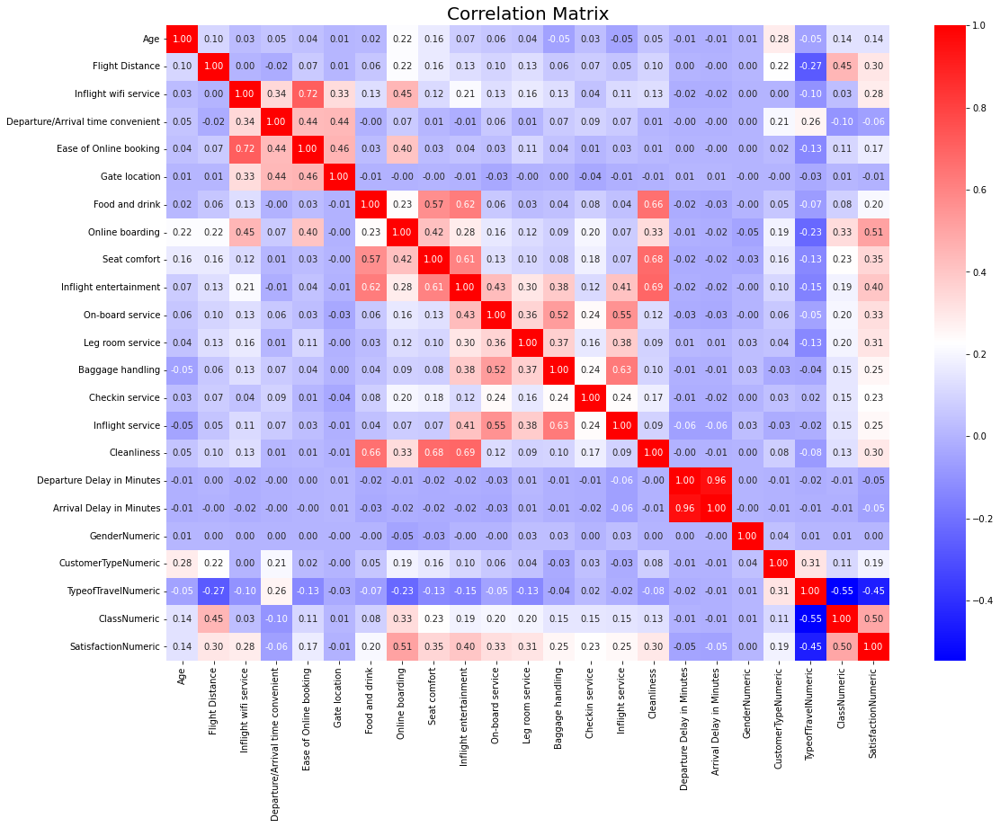

In [8]:
f, ax = plt.subplots(figsize=[18, 13])
sns.heatmap(dfclean.corr(), annot=True, fmt=".2f", ax=ax, cmap="bwr")
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

Very strong correlations (values from 0.8 to 1 or -0.8 to -1.0)
Strong correlations (values from 0.6 to 0.8 or -0.6 to -0.8)
Moderate correlations (values from 0.4 to 0.6 or -0.4 to -0.6) 

#### Check distribution of the data

C:\Datascience\Anaconda3\envs\ML7331\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



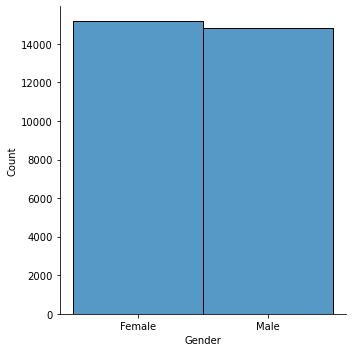

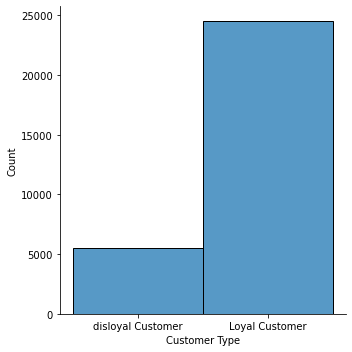

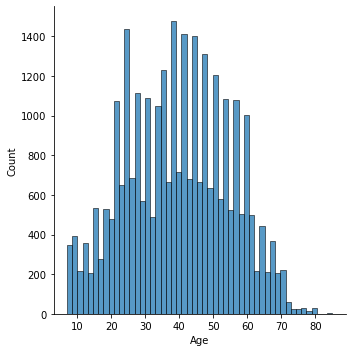

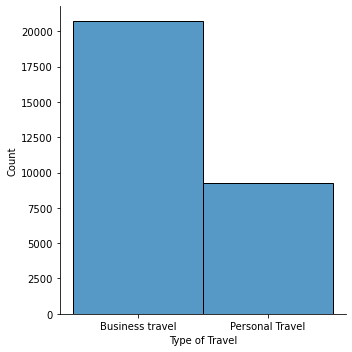

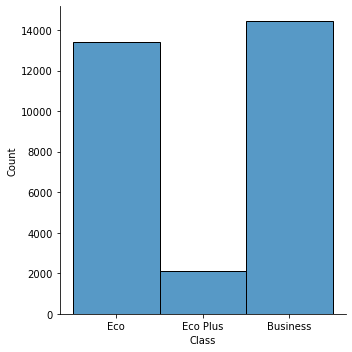

...

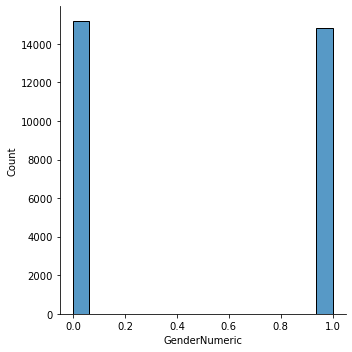

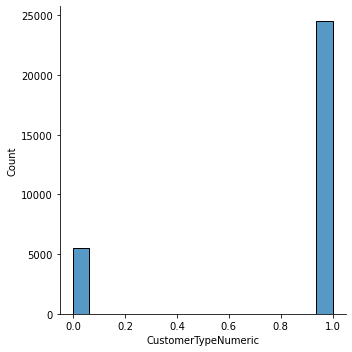

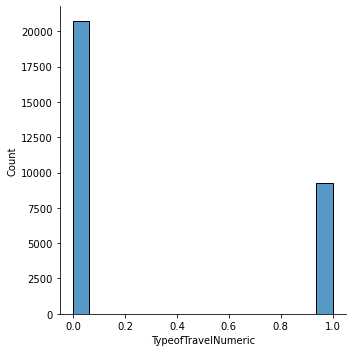

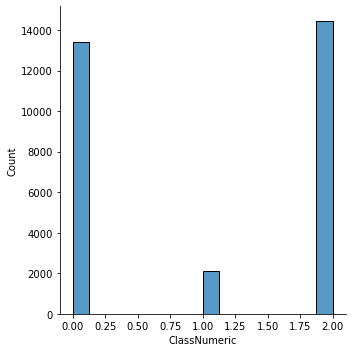

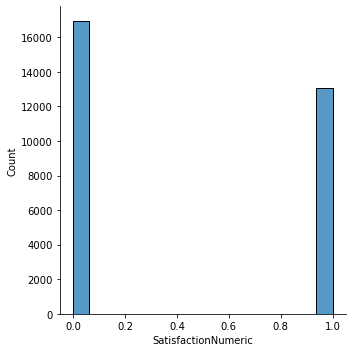

In [9]:
##distribution of the data

for column in dfclean:
    
    sns.displot(x=column, data=dfclean)

In [10]:
print (dfclean.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 16096 to 86438
Data columns (total 28 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             30000 non-null  object 
 1   Customer Type                      30000 non-null  object 
 2   Age                                30000 non-null  int64  
 3   Type of Travel                     30000 non-null  object 
 4   Class                              30000 non-null  object 
 5   Flight Distance                    30000 non-null  int64  
 6   Inflight wifi service              30000 non-null  int64  
 7   Departure/Arrival time convenient  30000 non-null  int64  
 8   Ease of Online booking             30000 non-null  int64  
 9   Gate location                      30000 non-null  int64  
 10  Food and drink                     30000 non-null  int64  
 11  Online boarding                    30000 non-null 

#### Summary of values to be used in classification modeling
A total of +100,000 passenger results are recorded in this data set.
We have a combination of categorical, ordinal and continous variable in this dataset.

- __Gender:__- Gender of the passengers (Female, Male) - Categorical Variable
- __Customer Type:__- The customer type (Loyal customer, disloyal customer) - Categorical Variable
- __Age:__- The actual age of the passengers - Continous Variable
- __Type of Travel:__- Purpose of the flight of the passengers (Personal Travel, Business Travel) - Categorical Variable
- __Class:__- Travel class in the plane of the passengers (Business, Eco, Eco Plus) - Categorical Variable
- __Flight distance:__- The flight distance of this journey - Continous Variable
- __Inflight wifi service:__- Satisfaction level of the inflight wifi service (0:Not Applicable;1-5) - Categorical Variable
- __Departure/Arrival time convenient:__- Satisfaction level of Departure/Arrival time convenient - Categorical Variable
- __Ease of Online booking:__- Satisfaction level of online booking - Categorical Variable
- __Gate location:__- Satisfaction level of Gate location - Categorical Variable
- __Food and drink:__- Satisfaction level of Food and drink - Categorical Variable
- __Online boarding:__- Satisfaction level of online boarding - Categorical Variable
- __Seat comfort:__- Satisfaction level of Seat comfort - Categorical Variable
- __Inflight entertainment:__- Satisfaction level of inflight entertainment - Categorical Variable
- __On-board service:__- Satisfaction level of On-board service - Categorical Variable
- __Leg room service:__- Satisfaction level of Leg room service - Categorical Variable
- __Baggage handling:__- Satisfaction level of baggage handling - Categorical Variable
- __Check-in service:__- Satisfaction level of Check-in service - Categorical Variable
- __Inflight service:__- Satisfaction level of inflight service - Categorical Variable
- __Cleanliness:__- Satisfaction level of Cleanliness - Categorical Variable
- __Departure Delay in Minutes:__- Minutes delayed when departure - Continous Variable
- __Arrival Delay in Minutes:__- Minutes delayed when Arrival - Continous Variable
- __Satisfaction:__- Airline satisfaction level(Satisfaction, neutral or dissatisfaction) - Categorical Variable

*** 
### [10 points] Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs.

In [11]:
 #Sum Survey Score Columns - index(6:19)
dfclean['Survey_Total']=dfclean.iloc[:,6:19].sum(axis=1)

#Add Age Groups
dfclean['Age_Group'] = pd.cut(dfclean['Age'], bins = [0,17,35,65,90], labels=["Adolescent", "Young Adult", "Middle Age", "Senior"], right=True)
dfclean['Age_Group_Numeric'] = pd.cut(dfclean['Age'], bins = [0,17,35,65,90], labels=["1", "2", "3", "4"], right=True)

#Add Distance Groups
dfclean['Distance_Group'] = pd.cut(dfclean['Flight Distance'], bins = [0,500,1000,2500,5000], labels=["Short", "Moderate", "Long", "Extra Long"], right=True)
dfclean['Distance_Group_Numeric'] = pd.cut(dfclean['Flight Distance'], bins = [0,500,1000,2500,5000], labels=["1", "2", "3", "4"], right=True)

#Add Departure Delay Groups
dfclean['Departure_Delay_Group'] = pd.cut(dfclean['Departure Delay in Minutes'], bins = [-1,1,100,1600], labels=["None","Minimal","Long"], right=True)
dfclean['Departure_Delay_Group_Numeric'] = pd.cut(dfclean['Departure Delay in Minutes'], bins = [-1,1,100,1600], labels=["0","1","2"], right=True)




dfclean.head(n=50)

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,TypeofTravelNumeric,ClassNumeric,SatisfactionNumeric,Survey_Total,Age_Group,Age_Group_Numeric,Distance_Group,Distance_Group_Numeric,Departure_Delay_Group,Departure_Delay_Group_Numeric
16096,Female,disloyal Customer,37,Business travel,Eco,230,4,5,4,2,...,0,0,0,40,Middle Age,3,Short,1,None,0
12674,Male,Loyal Customer,13,Personal Travel,Eco Plus,978,2,4,2,3,...,1,1,0,37,Adolescent,1,Moderate,2,None,0
58455,Male,Loyal Customer,16,Personal Travel,Eco,268,4,2,4,4,...,1,0,1,42,Adolescent,1,Short,1,None,0
24531,Male,Loyal Customer,63,Business travel,Business,271,0,0,0,1,...,0,2,1,27,Middle Age,3,Short,1,Minimal,1
33278,Female,Loyal Customer,31,Business travel,Business,665,2,2,2,2,...,0,2,0,30,Young Adult,2,Moderate,2,Minimal,1
79099,Female,Loyal Customer,50,Personal Travel,Eco Plus,250,2,5,2,5,...,1,1,0,49,Middle Age,3,Short,1,None,0
95771,Female,disloyal Customer,25,Business travel,Eco,334,1,3,1,4,...,0,0,0,40,Young Adult,2,Short,1,None,0
30678,Female,Loyal Customer,43,Business travel,Business,1788,1,1,5,1,...,0,2,0,25,Middle Age,3,Long,3,Minimal,1
8795,Female,Loyal Customer,56,Personal Travel,Eco,290,2,4,2,3,...,1,0,0,38,Middle Age,3,Short,1,None,0
95150,Female,Loyal Customer,20,Personal Travel,Eco,577,2,4,2,4,...,1,0,0,41,Young Adult,2,Moderate,2,None,0


In [12]:
#Plotly Histogram - Age
px.histogram(dfclean['Age'], x= "Age",
             title = 'Age Distribution',
             )

In [13]:
#Plotly Histogram - Flight Distance
px.histogram(dfclean['Flight Distance'], x= "Flight Distance",
             title = 'Flight Distance Distribution',
             )

In [14]:
#Plotly Histogram - Departure Delay in Minutes
px.histogram(dfclean['Departure Delay in Minutes'], x= "Departure Delay in Minutes",
             title = 'Departure Delay Distribution',
             nbins = 50,
             )

In [15]:
#Plotly Histogram - Arrival Delay in Minutes
px.histogram(dfclean['Arrival Delay in Minutes'], x= "Arrival Delay in Minutes",
             title = 'Arrival Delay Distribution',
             nbins = 50,
             )

In [16]:
px.box(dfclean,
       x="Class", y="Age", 
       color="Class",
       title = "Box Plot of Age by Class")

In [17]:
#ANOVA of class to age
# Ordinary Least Squares (OLS) model
model = ols('Age ~ C(Class)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Class),1.377189e+05,2.0,305.73126,3.612122e-132
Residual,6.756184e+06,29997.0,NaN,NaN


The ANOVA between age and class shows overwhelming evidence that there is a difference between the mean age of travelers among the various classes.

In [18]:
px.box(dfclean,
       x="Class", y="Survey_Total", 
       color="Class",
       title = "Box Plot of Survey Total by Class")

In [19]:
#ANOVA of Class to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Class)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Class),1.612037e+05,2.0,1190.497879,0.0
Residual,2.030927e+06,29997.0,NaN,NaN


The ANOVA between class and survey score shows overwhelming evidence that there is a difference between the mean survey score among the classes.

In [20]:
px.box(dfclean,
       x="Distance_Group", y="Survey_Total", 
       color="Distance_Group",
       title = "Box Plot of Distance Traveled by Survey Total")

In [21]:
#ANOVA of age to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Distance_Group)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Distance_Group),4.797367e+04,3.0,223.711584,1.522536e-143
Residual,2.144157e+06,29996.0,NaN,NaN


The ANOVA between distance group and survey score shows overwhelming evidence that there is a difference between the mean survey score among the distance groups.

In [22]:
#ANOVA of class to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Age)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Age),7.313667e+04,74.0,13.957508,1.317885e-165
Residual,2.118994e+06,29925.0,NaN,NaN


In [23]:
px.box(dfclean,
       x="Departure_Delay_Group", y="Survey_Total", 
       color="Departure_Delay_Group",
       title = "Box Plot of Total by Departure Delay Group")

In [24]:
#ANOVA of age to Total Survey Score
# Ordinary Least Squares (OLS) model
model = ols('Survey_Total ~ C(Departure_Delay_Group)', data=dfclean).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Departure_Delay_Group),1.106722e+03,2.0,7.575987,0.000514
Residual,2.191024e+06,29997.0,NaN,NaN


The ANOVA between departure delay group and survey score shows overwhelming evidence that there is a difference between the mean survey score among the distance groups.

In [25]:
#2 Sample T-Test - Male vs Female

# Subset data
male = dfclean.query('Gender == "Male"')['Survey_Total']
female = dfclean.query('Gender == "Female"')['Survey_Total']

dfclean.groupby('Gender').describe()

Age                                                     \
          count       mean        std  min   25%   50%   75%   max   
Gender                                                               
Female  15187.0  39.277540  15.146267  7.0  27.0  40.0  51.0  85.0   
Male    14813.0  39.480861  15.172475  7.0  27.0  40.0  51.0  85.0   

       Flight Distance               ... SatisfactionNumeric       \
                 count         mean  ...                 75%  max   
Gender                               ...                            
Female         15187.0  1185.586028  ...                 1.0  1.0   
Male           14813.0  1194.320934  ...                 1.0  1.0   

       Survey_Total                                                     
              count       mean       std   min   25%   50%   75%   max  
Gender                                                                  
Female      15187.0  42.071509  8.556451  14.0  36.0  42.0  48.0  64.0  
Male        14813.0  42.105650  8.540193  15.0  36.0  42.0  48.0  65.0  

[2 rows x 192 columns]

In [26]:
#Check normality assumption

#Plotly Histogram - Total
px.histogram(dfclean, x= "Survey_Total",
             title = 'Survey Total Distribution',
             facet_col="Gender"
             )

In [27]:
#Check Variance Assumptions
stats.levene(male, female)

LeveneResult(statistic=0.015479923455937293, pvalue=0.9009848861903786)

In [28]:
#T-Test
res = stats.ttest_ind(male, female, equal_var=True)

display(res)

Ttest_indResult(statistic=0.3458585763053265, pvalue=0.7294514263123113)

##### Two sample T Test for gender
We failed to reject the null hypothesis at alpha 0.05, as such, based on this analysis we do not see a difference in means for survey scores between gender.

***
### Modeling and Evaluation (50 points total) Different tasks will require different evaluation methods. Be as thorough as possible when analyzing the data you have chosen and use visualizations of the results to explain the performance and expected outcomes whenever possible. Guide the reader through your analysis with plenty of discussion of the results. 



#### Option A: Cluster Analysis
- Perform cluster analysis using several clustering methods
- How did you determine a suitable number of clusters for each method?
- Use internal and/or external validation measures to describe and compare the clusterings and the clusters (some visual methods would be good).
- Describe your results. What findings are the most interesting and why?

### KNN Clustering with PCA

In [29]:
#set data to be ready for cluster analysis
cluster_df = dfclean.copy()

continuous_features = ['Flight Distance','Departure Delay in Minutes','Arrival Delay in Minutes']

# and the oridnal values to be integers
ordinal_features = ['Age','Inflight wifi service','Departure/Arrival time convenient']

# we won't touch these variables, keep them as categorical
categ_features = ['GenderNumeric','TypeofTravelNumeric','CustomerTypeNumeric', 'SatisfactionNumeric'];

# use the "astype" function to change the variable type
cluster_df[continuous_features] = cluster_df[continuous_features].astype(np.float64)
cluster_df[ordinal_features] = cluster_df[ordinal_features].astype(np.int64)
cluster_df = cluster_df.drop(['Age_Group','Distance_Group','Distance_Group_Numeric','Gender','Customer Type','Type of Travel', 'Class','Departure_Delay_Group','Departure_Delay_Group_Numeric','Age_Group_Numeric', 'satisfaction'], axis=1)


cluster_df.info() # now our data looks better!!

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 16096 to 86438
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                30000 non-null  int64  
 1   Flight Distance                    30000 non-null  float64
 2   Inflight wifi service              30000 non-null  int64  
 3   Departure/Arrival time convenient  30000 non-null  int64  
 4   Ease of Online booking             30000 non-null  int64  
 5   Gate location                      30000 non-null  int64  
 6   Food and drink                     30000 non-null  int64  
 7   Online boarding                    30000 non-null  int64  
 8   Seat comfort                       30000 non-null  int64  
 9   Inflight entertainment             30000 non-null  int64  
 10  On-board service                   30000 non-null  int64  
 11  Leg room service                   30000 non-null 

In [30]:
#scale values
cluster_df_scaled = StandardScaler().fit(cluster_df).transform(cluster_df.astype(float))

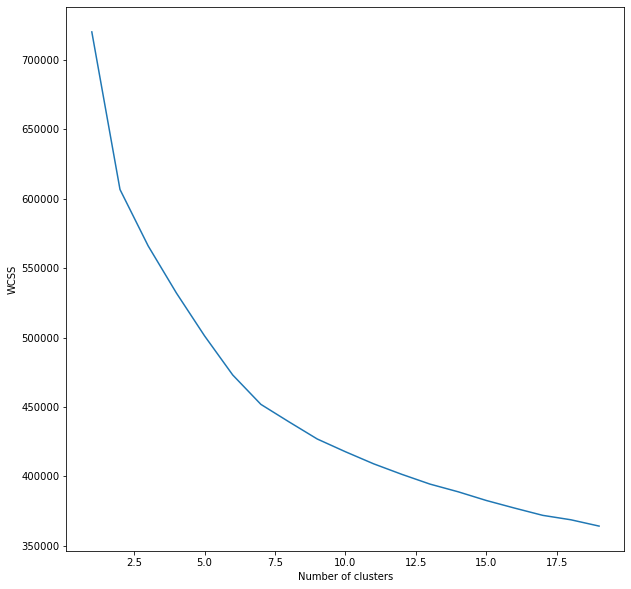

In [31]:
# finding optimal cluster amount
wcss = []
for i in range(1,20):
   model = KMeans(n_clusters = i, init = "k-means++", random_state=50)
   model.fit(cluster_df_scaled)
   wcss.append(model.inertia_)
plt.figure(figsize=(10,10))
plt.plot(range(1,20), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

##### WCSS summary
Based on the WCSS curve, we see the it stars to shallow around 7.5.  To ensure that we do not over fit our clustering models we will use 8 as the clusters for our PCA components.  Any more may impact the models performance.

##### PCA used to reduce dimensionality
Utilizing PCA, we selected 2 PCA components to allow for easier interpretation and visualization of the clusters.

In [32]:
# reducing dimensionality and create new data based on our PCA.
pca = PCA(2)
data = pca.fit_transform(cluster_df_scaled)
data

array([[ 1.84267024, -2.00373957],
       [ 2.20544825, -0.90255478],
       [ 0.088318  , -1.11898053],
       ...,
       [ 4.19832338,  0.55916796],
       [-0.19883972,  2.05908113],
       [ 2.00110632,  0.19032105]])

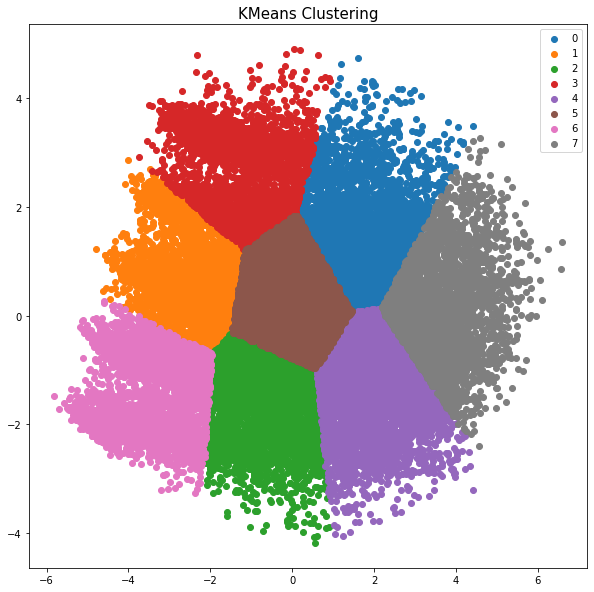

In [33]:
# clustering with PCA components

model = KMeans(n_clusters = 8, init = "k-means++")
label = model.fit_predict(data)


plt.figure(figsize=(10,10))
uniq = np.unique(label)
for i in uniq:
   plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)


plt.legend()
plt.title('KMeans Clustering', fontsize=15)
plt.show()

In [34]:
metrics.silhouette_score(cluster_df_scaled, label)

0.04467975673601045

#### Intepretation of Silhouette score of KNN Clustering
We use the Silhouette score to measure how dense and well-separated the clusters are for our data set.
The silhouette score of 1 means that the clusters are very dense and nicely separated. The score of 0 means that clusters are overlapping. The score of less than 0 means that data belonging to clusters may be wrong/incorrect.
In this instance we have a Silhouette score 0.04467.  Since its not negative and the visual show distinct clustering we determined that our PCA scaled cluster is adequate.

### DBSCAN Clustering

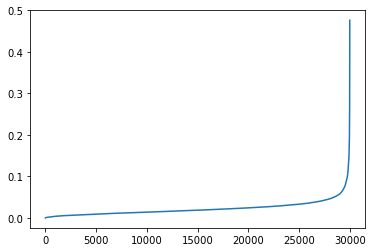

In [35]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(data)
distances, indices = nbrs.kneighbors(data)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

We determined that eps for the dbscan starts to have dimishing results at 0.15.  As such, for our DBScan clustering we will use 0.2 for this analysis.

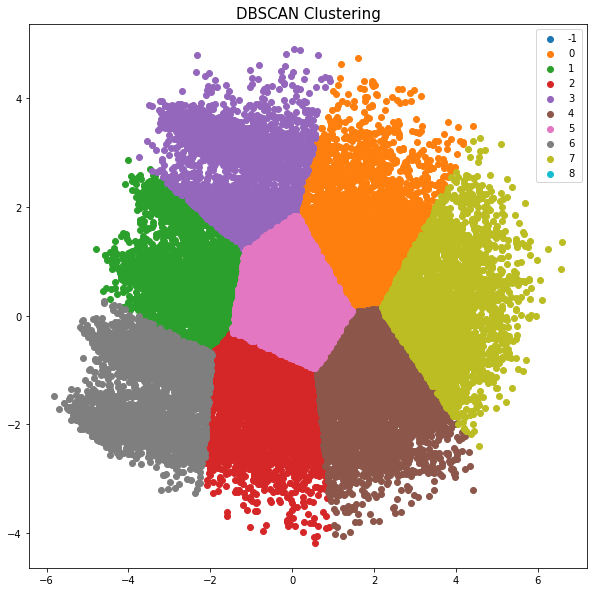

In [36]:
# DBScan Clustering with PCA

dbscan = DBSCAN(eps=0.2)
dbscan_label = dbscan.fit_predict(data)

plt.figure(figsize=(10,10))
uniq = np.unique(dbscan_label)
for i in uniq:
   plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)


plt.legend()
plt.title('DBSCAN Clustering', fontsize=15)
plt.show()

In [37]:
metrics.silhouette_score(cluster_df_scaled, dbscan_label)

-0.0652248129630493

#### Intepretation of Silhouette score of DBScan Clustering
In the Dbscan instance we have a Silhouette score -0.65.  Although visually we see great seperatation, the Silhouette score is negative which would suggest that the data belonging to clusters may be wrong/incorrect.  As such, we can discount DBscan from our final model.

#### Hierarchical Agglomerative Clustering (HAC) Clustering

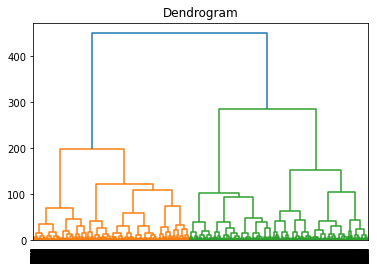

In [38]:
# utilizing a dendrogram to find the optimal number of clusters

dendrogram = sch.dendrogram(sch.linkage(data, method='ward'))
plt.title('Dendrogram')
plt.show()

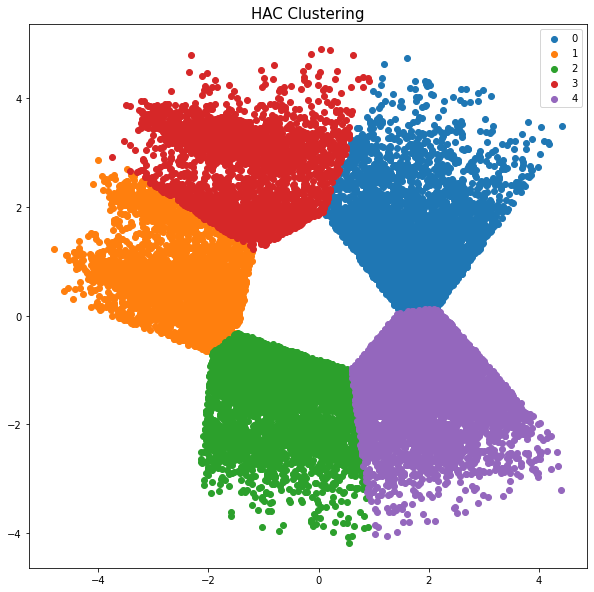

In [39]:
hac = AgglomerativeClustering(n_clusters=5, affinity='euclidean',linkage='ward')
hac_label = hac.fit_predict(data)

plt.figure(figsize=(10,10))
uniq = np.unique(hac_label)
for i in uniq:
    plt.scatter(data[label == i , 0] , data[label == i , 1] , label = i)


plt.legend()
plt.title('HAC Clustering', fontsize=15)
plt.show()

In [40]:
metrics.silhouette_score(cluster_df_scaled, hac_label)

0.07435444471933086

#### Intepretation of Silhouette score of HAC Clustering
In the HAC instance we have a Silhouette score 0.07435.  Since its not negative and the visual show distinct clustering we determined that our PCA scaled cluster is adequate.

In [41]:
result_df = dfclean.copy()
result_df['kmeans_cluster'] = label
result_df['dbscan_cluster'] = dbscan_label
result_df['hac_cluster'] = hac_label
result_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 16096 to 86438
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   Gender                             30000 non-null  object  
 1   Customer Type                      30000 non-null  object  
 2   Age                                30000 non-null  int64   
 3   Type of Travel                     30000 non-null  object  
 4   Class                              30000 non-null  object  
 5   Flight Distance                    30000 non-null  int64   
 6   Inflight wifi service              30000 non-null  int64   
 7   Departure/Arrival time convenient  30000 non-null  int64   
 8   Ease of Online booking             30000 non-null  int64   
 9   Gate location                      30000 non-null  int64   
 10  Food and drink                     30000 non-null  int64   
 11  Online boarding                    30

Text(0.5, 1.0, 'HAC')

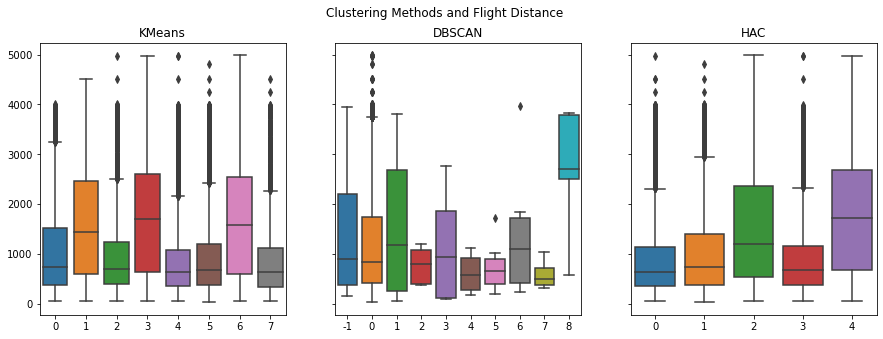

In [53]:
# clusters compared to Gender
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
fig.suptitle('Clustering Methods and Flight Distance')

# Kmeans
sns.boxplot(ax=axes[0], x=result_df['kmeans_cluster'].values, y=result_df['Flight Distance'].values)
axes[0].set_title('KMeans')

# DBSCAN
sns.boxplot(ax=axes[1], x=result_df['dbscan_cluster'].values, y=result_df['Flight Distance'].values)
axes[1].set_title('DBSCAN')

# HAC
sns.boxplot(ax=axes[2], x=result_df['hac_cluster'].values, y=result_df['Flight Distance'].values)
axes[2].set_title('HAC')


We did not observe that flight distance was signifcant different between the clusters. 

Text(0.5, 1.0, 'HAC')

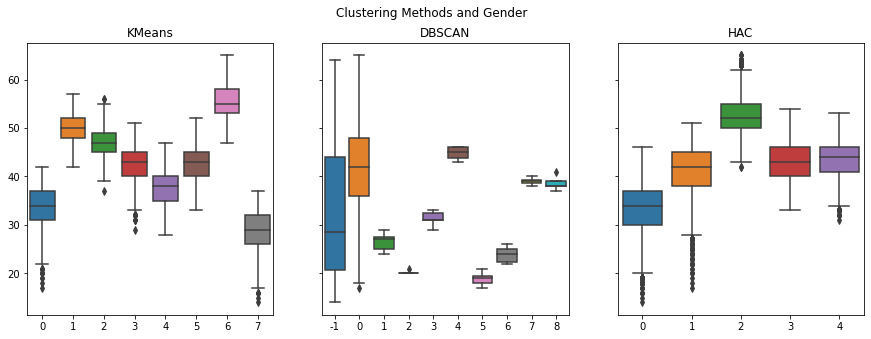

In [43]:
# clusters compared to Survey Total
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
fig.suptitle('Clustering Methods and Gender')

# Kmeans
sns.boxplot(ax=axes[0], x=result_df['kmeans_cluster'].values, y=result_df['Survey_Total'].values)
axes[0].set_title('KMeans')

# DBSCAN
sns.boxplot(ax=axes[1], x=result_df['dbscan_cluster'].values, y=result_df['Survey_Total'].values)
axes[1].set_title('DBSCAN')

# HAC
sns.boxplot(ax=axes[2], x=result_df['hac_cluster'].values, y=result_df['Survey_Total'].values)
axes[2].set_title('HAC')


We have already discarded DBScan model in our previous note.
Based on the boxplots, the KMeans model showed the best seperation (variance between clusters) and we determine that our Kmean model a good candidate to determine customer satifaction.

### Deployment (10 points total)
- Be critical of your performance and tell the reader how you current model might be usable by
other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling?
- How useful is your model for interested parties (i.e., the companies or organizations
that might want to use it)?
- How would your deploy your model for interested parties?
- What other data should be collected?
- How often would the model need to be updated, etc.?

#### Deployment Summary
HAC and Kmean models proved effective at creating clearly defined groups that customers could then extropolate back to the original data to find unclear relationships to customer satifcation.  We determine that Kmeans model achieved our goal with the clear seperations in the clusters.

This type of model is useful because we are able to take a data driven approach to generate behavioral benchmarks to show how one responds to their satisfaction to the airline.  We identified this in Kmeans model has the ability to identify actual dissatisfaction or potential anomalies.

Deployment of this method can be done be sharing this code to interested airline companies.  We will be required to refactor the data on the company's record.  In addition, we can provide airline companies to incorporate survey requirements to ensure that the model captures the relevant needs to the model

Other additional data that we may think will impact the data set;
- __Age of aircraft or last remodel:__- Functionality on the aircraft in today's environment may impact customer view of the airline.
- __Weather condition during the flight:__- Depending on the conditions of the flight, we may have encountered turbulent weather that is out of the airlines control that we could identify as anomalies that may have skewed the customer satisfaction

The cadence of these reports should coincide to quarterly financial reports as this can be utilized to assess and course correct any issues to the financial plan as low customer satisfaction impacts both top and bottom line of the P&L.

### Exceptional Work (10 points total)
You have free reign to provide additional analyses or combine analyses

### Gausian Mixture

In [44]:
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture 
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [45]:
cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 16096 to 86438
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                30000 non-null  int64  
 1   Flight Distance                    30000 non-null  float64
 2   Inflight wifi service              30000 non-null  int64  
 3   Departure/Arrival time convenient  30000 non-null  int64  
 4   Ease of Online booking             30000 non-null  int64  
 5   Gate location                      30000 non-null  int64  
 6   Food and drink                     30000 non-null  int64  
 7   Online boarding                    30000 non-null  int64  
 8   Seat comfort                       30000 non-null  int64  
 9   Inflight entertainment             30000 non-null  int64  
 10  On-board service                   30000 non-null  int64  
 11  Leg room service                   30000 non-null 

##### Step 1. Normalize the data

In [46]:
# Standardize data
scaler = StandardScaler() 
scaled_df = scaler.fit_transform(cluster_df) 
  
# Normalizing the Data 
normalized_df = normalize(scaled_df) 
  
# Converting the numpy array into a pandas DataFrame 
normalized_df = pd.DataFrame(normalized_df)

##### Step 2. AIC and BIC Testing on Normalized Data

In [47]:
n_range = range(2,20)

# Create empty lists to store the BIC and AIC values
bic_score = []
aic_score = []

for n in n_range:
    gm = GaussianMixture(n_components=n, 
                         random_state=123, 
                         n_init=10)
    gm.fit(normalized_df)
    
    # Append the BIC and AIC to the respective lists
    bic_score.append(gm.bic(normalized_df))
    aic_score.append(gm.aic(normalized_df))

Text(0.5, 1.0, 'BIC and AIC Scores Per Number Of Clusters')

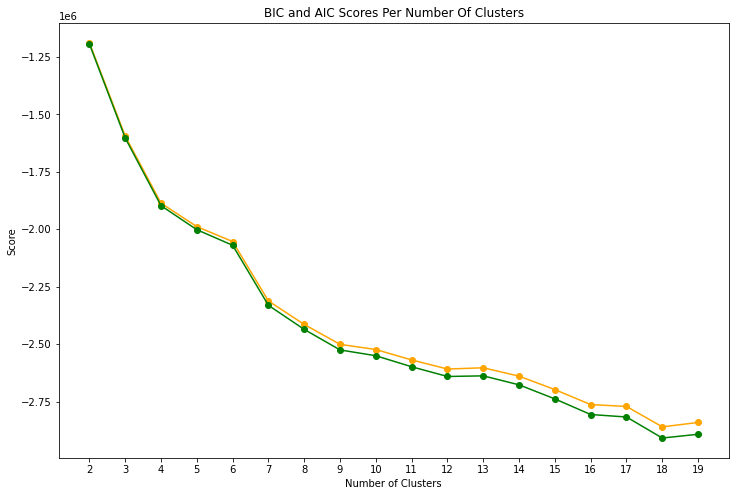

In [48]:
fig, ax = plt.subplots(figsize=(12,8),nrows=1)
ax.plot(n_range, bic_score, '-o', color='orange')
ax.plot(n_range, aic_score, '-o', color='green')
ax.set(xlabel='Number of Clusters', ylabel='Score')
ax.set_xticks(n_range)
ax.set_title('BIC and AIC Scores Per Number Of Clusters')

In this AIC/BIC plot we can look to see the best prediction model has we increase the numbers of clusters. One of the more concerning aspect of this particular AIC/BIC graph is the amount of clusters required to optimize the model. We see a decrease at 4/5 clusters, however we see a continuous decrease in the scores. This makes it a challenge to have a definitive chose of clusters. 

In order to potentially help the gaussian mixture model to better help fit the dataset, utilizing PCA feature reduction will be necessary.

##### Step 3. Further reduce dimensions through PCA

In [49]:
# Reducing the dimensions of the data 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(normalized_df) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head(2)

gmm = GaussianMixture(n_components = 8) 
gmm.fit(X_principal)

GaussianMixture(n_components=8)

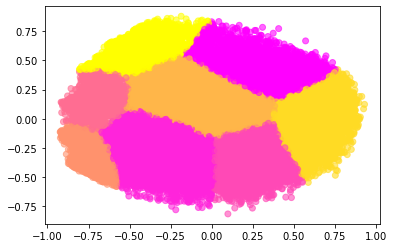

In [57]:
# Visualizing the clustering 
plt.scatter(X_principal['P1'], X_principal['P2'],  
           c = GaussianMixture(n_components = 8).fit_predict(X_principal), cmap =plt.cm.spring, alpha = 0.6) 
plt.show() 

##### Step 4. AIC and BIC Testing on Normalized PCA Data

In [51]:
n_range = range(2,11)

# Create empty lists to store the BIC and AIC values
bic_score = []
aic_score = []

for n in n_range:
    gm = GaussianMixture(n_components=n, 
                         random_state=123, 
                         n_init=10)
    gm.fit(X_principal)
    
    # Append the BIC and AIC to the respective lists
    bic_score.append(gm.bic(X_principal))
    aic_score.append(gm.aic(X_principal))

Text(0.5, 1.0, 'BIC and AIC Scores Per Number Of Clusters')

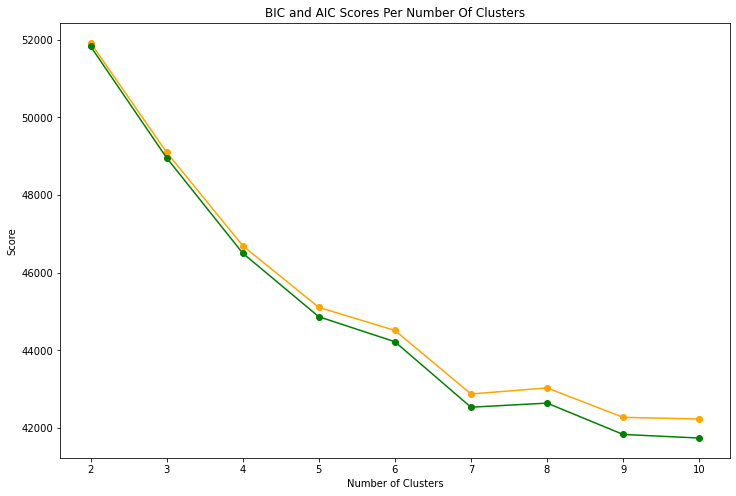

In [52]:
fig, ax = plt.subplots(figsize=(12,8),nrows=1)
ax.plot(n_range, bic_score, '-o', color='orange')
ax.plot(n_range, aic_score, '-o', color='green')
ax.set(xlabel='Number of Clusters', ylabel='Score')
ax.set_xticks(n_range)
ax.set_title('BIC and AIC Scores Per Number Of Clusters')

In the AIC/BIC cluster comparison graph we can see a large decrease in error at 7 clusters. This has beens consistent based on what we have seen with other model.  As such, having more that 7 clusters may result in over-fitting.

Keeping PCA for feature reduction consistent, to reduce the number of required clusters,  improved the AIC/BIC error scores. 

Conclusion
The Gaussian Mixture Model is another model that we would consider for this model.  Although, we have kept the utilization of PCA consistent through this analysis, we had to use PCA in order to improve performance, which makes interpretation of the data difficult. This makes determining which cluster to use challenging.